In [1]:
from IPython import get_ipython

In [2]:
if get_ipython():
    get_ipython().run_line_magic("load_ext", "autoreload")
    get_ipython().run_line_magic("autoreload", "2")
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import seaborn as sns
import sys
import scanpy as sc
import latenta as la
import jax
import jax.numpy as jnp
import optax
import tqdm.auto as tqdm
import scipy
import random
import re
import dill as pickle
import sklearn.decomposition
import os
import eyck
from general_functions.model_generation_functions import *
from general_functions.model_visualization_functions import *

2025-01-15 16:22:00.526520: W external/xla/xla/service/platform_util.cc:206] unable to create StreamExecutor for CUDA:0: : CUDA_ERROR_OUT_OF_MEMORY: out of memory
/srv/data/robinve/miniconda3/envs/latenta/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
with open("../../synthetic_data/no_dependencies_simple_synthetic_data.pkl", "rb") as f:
    adata1 = pickle.load(f)
with open("../../synthetic_data/dependencies_simple_synthetic_data.pkl", "rb") as f:
    adata2 = pickle.load(f)
with open("../../synthetic_data/no_dependencies_complex_synthetic_data.pkl", "rb") as f:
    adata3 = pickle.load(f)
with open("../../synthetic_data/dependencies_complex_synthetic_data.pkl", "rb") as f:
    adata4 = pickle.load(f)    

In [ ]:
def circular_correlation(theta, phi):
    """
    Circular correlation from "A Correlation Coefficient for Circular Data", Fisher and Lee, Biometrika, 1983

    »> import numpy as np
    »> theta = np.linspace(0, 2*np.pi, 10)
    »> phi = (np.linspace(0, 2*np.pi, 10) + np.pi + np.random.uniform(0, 1, 10)) % (2 * np.pi)
    »> cor = circular_correlation(theta, phi)
    »> cor > 0.8
    True

    »> theta = np.array([0, 1, 2, 3, 4])
    »> phi = np.array([3, 4, 5, 6, 7])
    »> cor = circular_correlation(theta, phi)
    »> cor
    1.
    """
    theta = theta * 2 * np.pi
    phi = phi * 2 * np.pi
    x = (
        np.sin(np.tril(theta - theta[:, None])) * np.sin(np.tril(phi - phi[:, None]))
    ).sum()
    b = (np.sin(np.tril(theta - theta[:, None])) ** 2).sum()
    c = (np.sin(np.tril(phi - phi[:, None])) ** 2).sum()

    d = np.sqrt(b) * np.sqrt(c)
    return x / d


In [4]:
def change_model_amortized_tuple(model, effects,initialization_func, placeholder=None):

    for i, effect in enumerate(effects):
        effect_name = effect
        if initialization_func.__name__ == 'semi_biased_initialization':
            placeholder[0] = i
            effect_name_number = i
        else:
            effect_name_number = i
        x_new = initialization_func()
        effect_name += str(effect_name_number)

        model = change_model_amortized(model,x_new, effect,effect_name)
    return model

In [5]:
def testing_process (adata, effects, n_models = 10):
    adata.layers["counts"] = adata.X
    base_model = create_base_model(adata, definition_type="object")
    def map_nested_fn(fn):
        """Recursively apply `fn` to key-value pairs of a nested dict."""
        def map_fn(nested_dict):
            return {k: (map_fn(v) if isinstance(v, dict) else fn(k, v)) for k, v in nested_dict.items()}
        return map_fn
    @map_nested_fn
    def label_fn(k, v):
        # print(k)
        if ("kernel" in k) or ("bias" in k):
            return "a"
        else:
            return "b"
    optimizer = optax.multi_transform({"b": optax.adam(5e-3), "a": optax.adam(1e-4)}, label_fn)
    scores,model_dict = latenta_processes_basic(base_model, optimizer, "base_model", "base_model_0", 2000)
    model = model_dict["base_model_0"][0]
    scores,model_dict = pd.DataFrame(), {}
    pca,cells,X =adata_pca(adata)
    x = latent_x(pca,cells,X)
    initialization_func1 = lambda: unbiased_initialization(x)
    initialization_func1.__name__ = 'unbiased_initialization'
    x_bias_loc_list = pre_caluclate_pca_biases(pca,cells,X)
    placeholder = [0]
    initialization_func2 = lambda: semi_biased_initialization(x,x_bias_loc_list, placeholder[0])
    initialization_func2.__name__ = 'semi_biased_initialization'

    for j in range(n_models):
        biased_model = change_model_amortized_tuple(model.clone(), effects,initialization_func1,placeholder)
        new_scores, new_model_dict = latenta_processes_basic(biased_model, optimizer, "biased_model", f"biased_model_0_{j}",5000)
        scores = pd.concat([scores, new_scores], axis=0, ignore_index=True)
        model_dict.update(new_model_dict)

    best_model_name = scores.iloc[scores["elbo"].idxmax()]["model_name"]
    biased_model = model_dict[best_model_name][0]
    biased_model_losses = model_dict[best_model_name][1]
    new_adata = data_adata_converter(biased_model, complete=True, size=2000)

    if np.allclose(adata.X, new_adata.X):
        print("transcriptomes are equal")
    sc.pl.umap(adata, color=adata.obs.columns)
    sc.pl.umap(new_adata, color=new_adata.obs.columns)

    return new_adata, scores,biased_model, biased_model_losses

In [70]:
import polyptich as pp
def correlation_visualization (adata1, adata2, model_text = "simple_model"):
    # Prepare the methods and names
    methods = ["Rubens"]
    names = ["Rubens"]

    for index, method in enumerate(methods):
        fig = pp.grid.Figure(pp.grid.Grid(padding_height=0, padding_width=0))

        grid = fig.main[1, 1] = pp.grid.Grid(padding_height=0.1, padding_width=0.4)
        s = 0.5

        w = 0.5
        h = 0.5

        max_n = 1000

        rows = pd.DataFrame({
            "name": adata1.obs.columns,
        })
        rows["ix"] = range(len(rows))
        rows = rows.set_index("name")

        columns = pd.DataFrame({
            "name": adata2.obs.columns,
        })
        columns["ix"] = range(len(columns))
        columns = columns.set_index("name")

        for row_name, (i,) in rows.iterrows():
            panel, ax = grid[i + 1, 0] = pp.grid.Panel((w, h))
            ax.text(0.4, 0.5, row_name, ha="center", va="center")
            ax.axis("off")


        for col_name, (i,) in columns.iterrows():
            col_name = col_name.split(".")[0]
            panel, ax = grid[0, i + 1] = pp.grid.Panel((w, h))
            ax.text(0.4, 0.5, col_name, ha="center", va="center")
            ax.axis("off")

        for row_name, (i,) in rows.iterrows():
            for column_name, (j,) in columns.iterrows():
                x = adata1.obs[row_name]
                y = adata2.obs[column_name]
                panel, ax = grid[i + 1, j + 1] = pp.grid.Panel((w, h))
                ax.scatter(x, y, s=0.5)
                if "CircularSpline" in column_name or row_name:
                    x, y = x.values, y.values
                    cor = circular_correlation(x, y)
                else:
                    cor = np.corrcoef(x, y)[0, 1]
                

                text = ax.text(0.5, 0.5, f"{cor:.2f}", transform=ax.transAxes, ha="center", va="center")
                text.set_path_effects(
                    [
                        mpl.patheffects.Stroke(linewidth=3, foreground="white"),
                        mpl.patheffects.Normal(),
                    ]
                )
                ax.axis("off")
        fig.main.align()

        horizontal = fig.main[0, 1] = pp.grid.Panel((grid.width, 0.2))
        horizontal.axis("off")
        horizontal.text(0.5, 0.5, names[index], va="center", ha="center")

        vertical = fig.main[1, 0] = pp.grid.Panel((0.2, grid.height))
        vertical.axis("off")
        vertical.text(-0.5, 0.5, "Real", rotation=90, va="center", ha="center")

        # Add a top-left title
        top_left = fig.main[0, 0] = pp.grid.Panel((0.4, 0.2))  # Adjust width and height as needed
        top_left.axis("off")
        top_left.text(0.5, 0.5, model_text, va="center", ha="center", fontsize=12, fontweight="bold")
        fig.display()


In [ ]:
def map_nested_fn(fn):
    """Recursively apply `fn` to key-value pairs of a nested dict."""
    def map_fn(nested_dict):
        return {k: (map_fn(v) if isinstance(v, dict) else fn(k, v)) for k, v in nested_dict.items()}
    return map_fn
@map_nested_fn
def label_fn(k, v):
    # print(k)
    if ("kernel" in k) or ("bias" in k):
        return "a"
    else:
        return "b"
optimizer = optax.multi_transform({"b": optax.adam(5e-3), "a": optax.adam(1e-4)}, label_fn)

100%|██████████| 5000/5000 [00:14<00:00, 339.44it/s]


transcriptomes are equal


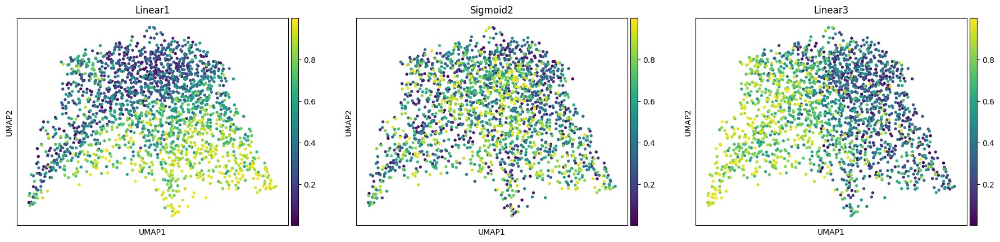

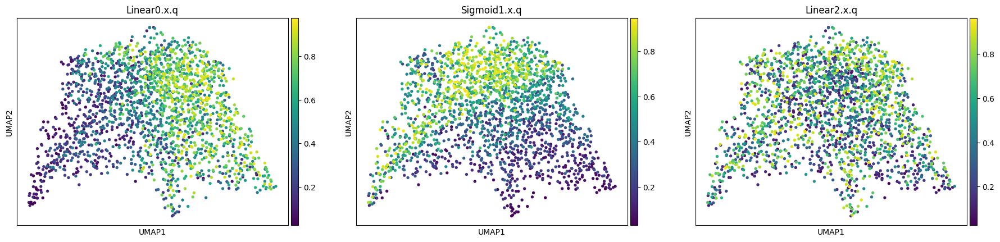

In [14]:
effects = ["Linear", "Sigmoid", "Linear"]
new_adata1, scores1,biased_model1, biased_model_losses1 = testing_process (adata1, effects, 20)

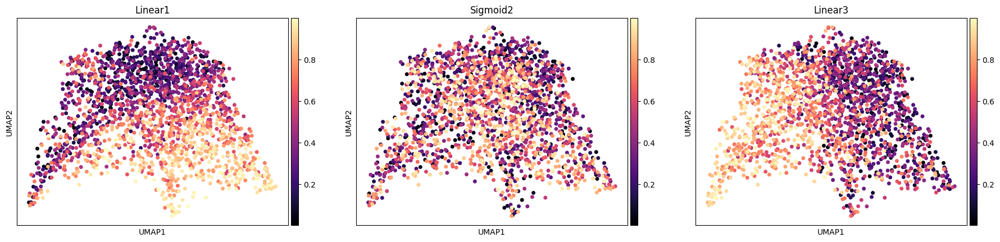

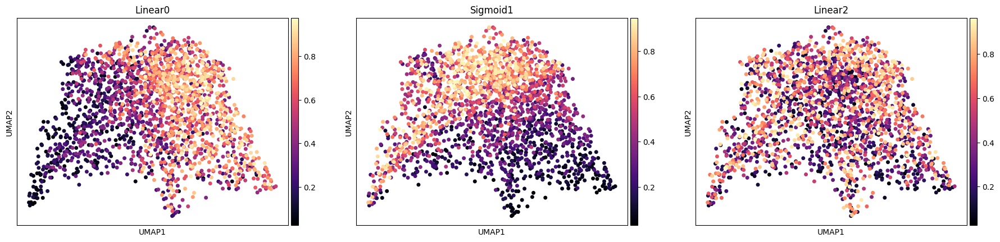

In [64]:
sc.pl.umap(adata1, color=adata1.obs.columns,size=100, cmap = "magma")
sc.pl.umap(new_adata1, color=new_adata1.obs.columns,title=[column.split(".")[0] for column in new_adata1.obs.columns],size=100, cmap = "magma")

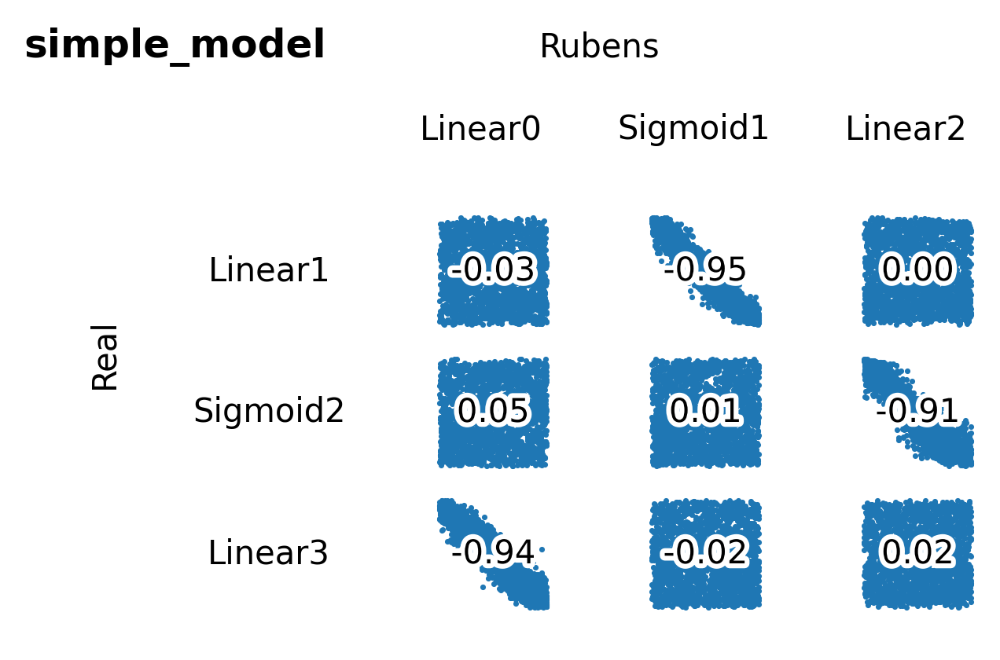

In [65]:
correlation_visualization (adata1, new_adata1, model_text = "simple_model")

  0%|          | 0/2000 [00:00<?, ?it/s]

100%|██████████| 5000/5000 [00:14<00:00, 356.56it/s]


transcriptomes are equal


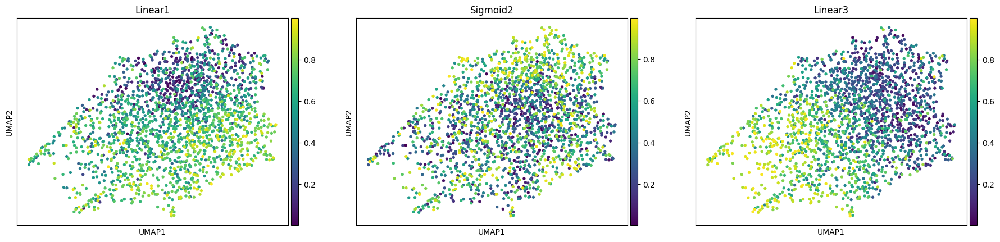

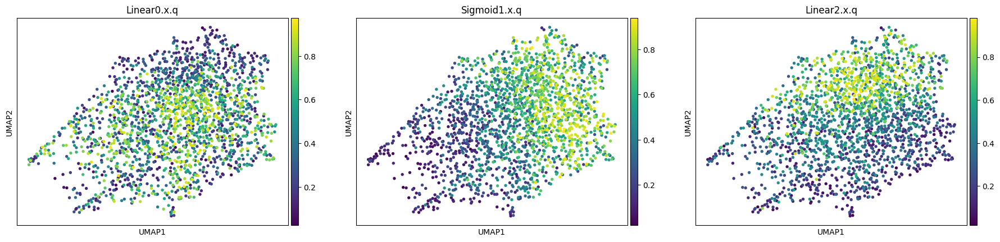

In [16]:
effects = ["Linear", "Sigmoid", "Linear"]
new_adata2, scores2,biased_model2, biased_model_losses2 = testing_process (adata2, effects, 20)

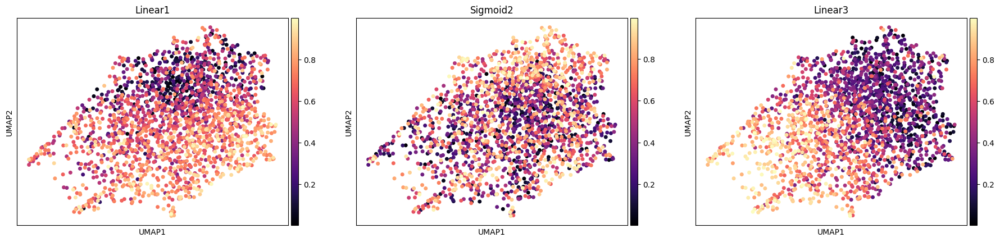

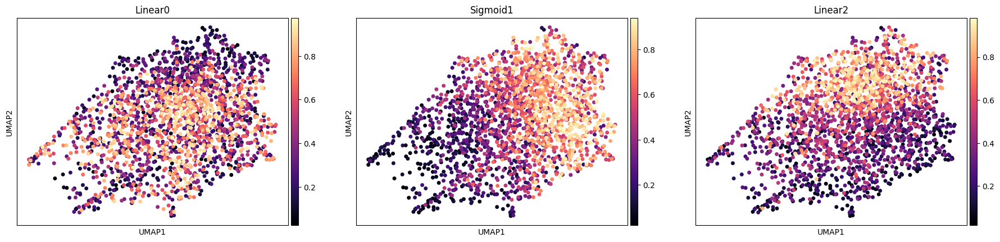

In [62]:
sc.pl.umap(adata2, color=adata2.obs.columns,size=100, cmap = "magma")
sc.pl.umap(new_adata2, color=new_adata2.obs.columns,title=[column.split(".")[0] for column in new_adata2.obs.columns],size=100, cmap = "magma")

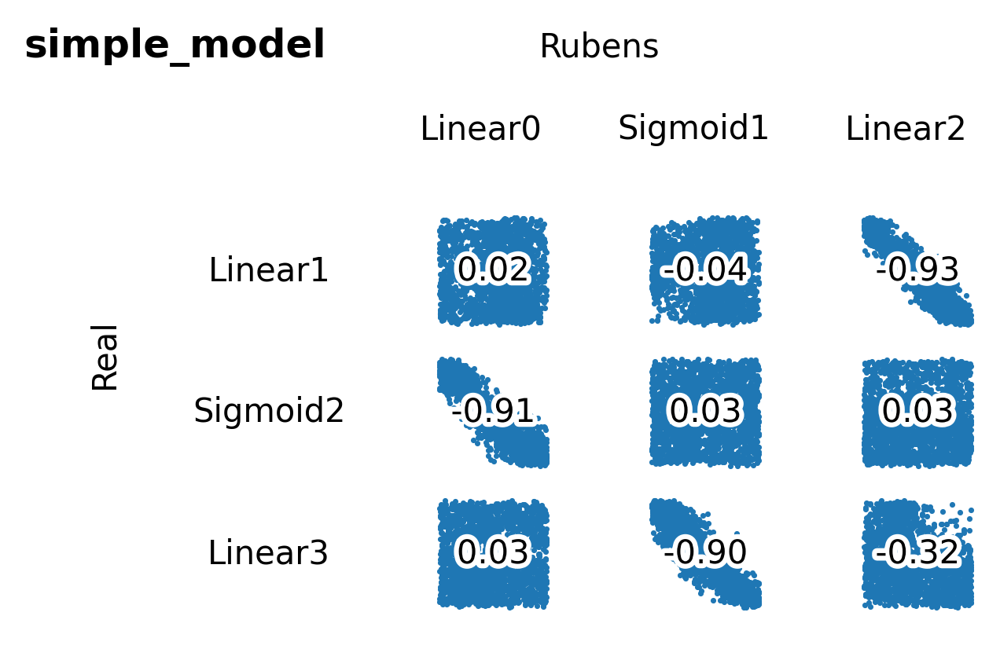

In [63]:
correlation_visualization (adata2, new_adata2, model_text = "simple_model")

100%|██████████| 5000/5000 [00:14<00:00, 338.42it/s]


100%|██████████| 5000/5000 [00:15<00:00, 323.25it/s]


transcriptomes are equal


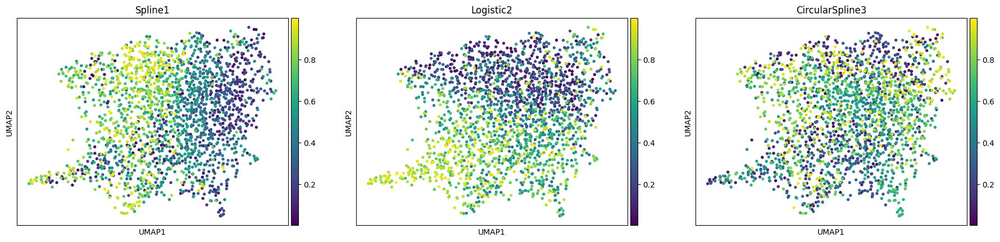

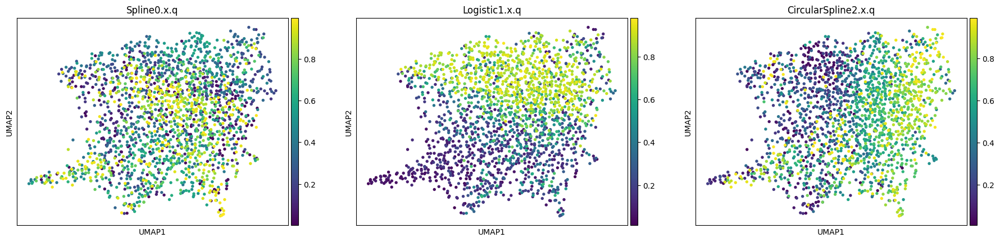

In [ ]:
effects = ["Spline", "Logistic", "CircularSpline"]
new_adata3, scores3,biased_model3, biased_model_losses3 = testing_process (adata3, effects, 20)

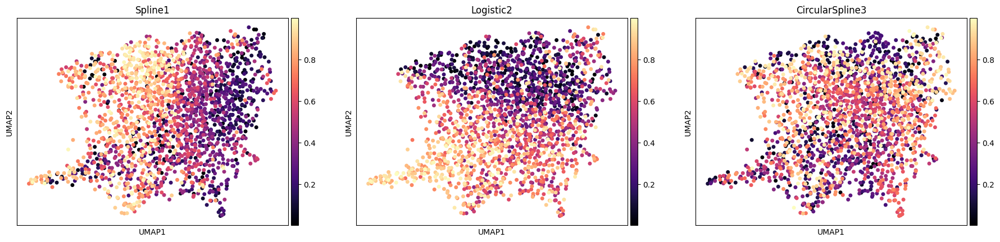

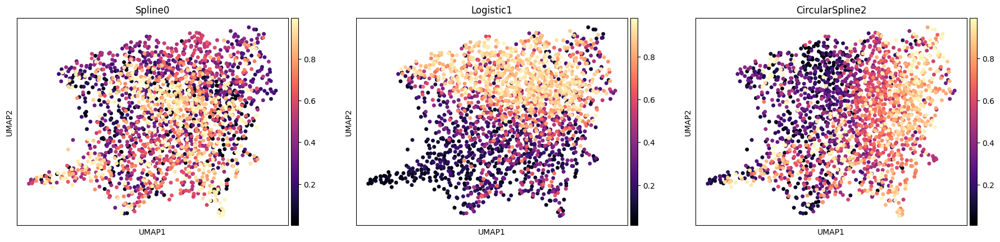

In [66]:
sc.pl.umap(adata3, color=adata3.obs.columns,size=100, cmap = "magma")
sc.pl.umap(new_adata3, color=new_adata3.obs.columns,title=[column.split(".")[0] for column in new_adata3.obs.columns],size=100, cmap = "magma")

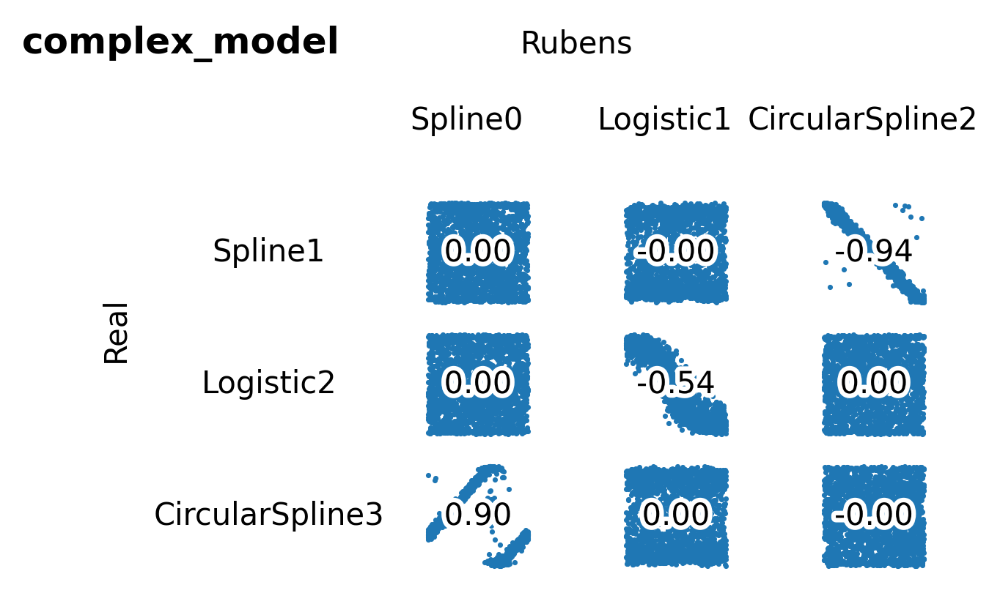

In [72]:
correlation_visualization (adata3, new_adata3, model_text = "complex_model")

100%|██████████| 5000/5000 [00:14<00:00, 337.15it/s]


transcriptomes are equal


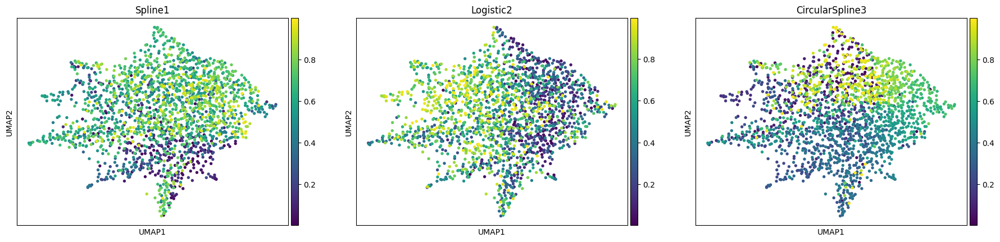

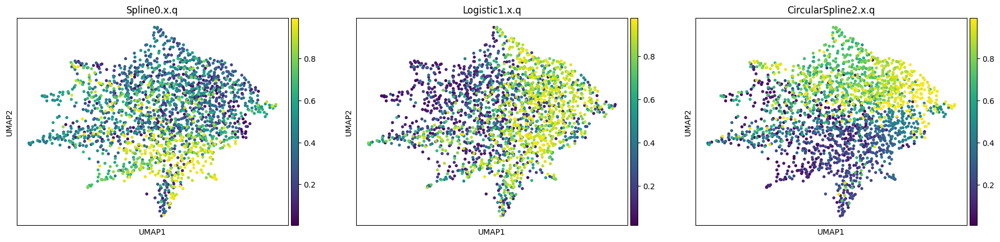

In [21]:
effects = ["Spline", "Logistic", "CircularSpline"]
new_adata4, scores4,biased_model4, biased_model_losses4 = testing_process (adata4, effects, 20)

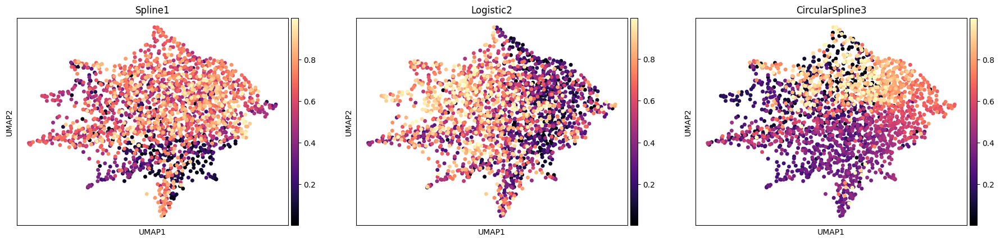

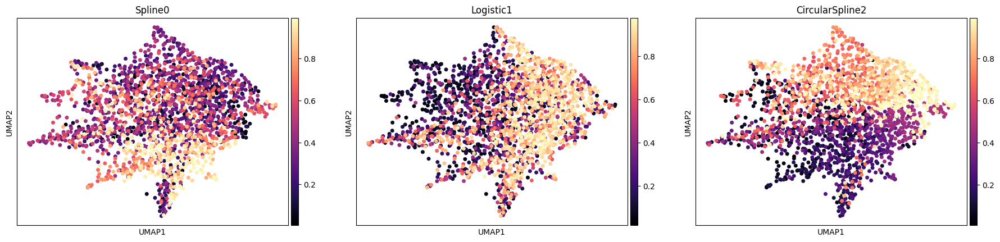

In [68]:
sc.pl.umap(adata4, color=adata4.obs.columns,size=100, cmap = "magma")
sc.pl.umap(new_adata4, color=new_adata4.obs.columns,title=[column.split(".")[0] for column in new_adata4.obs.columns],size=100, cmap = "magma")

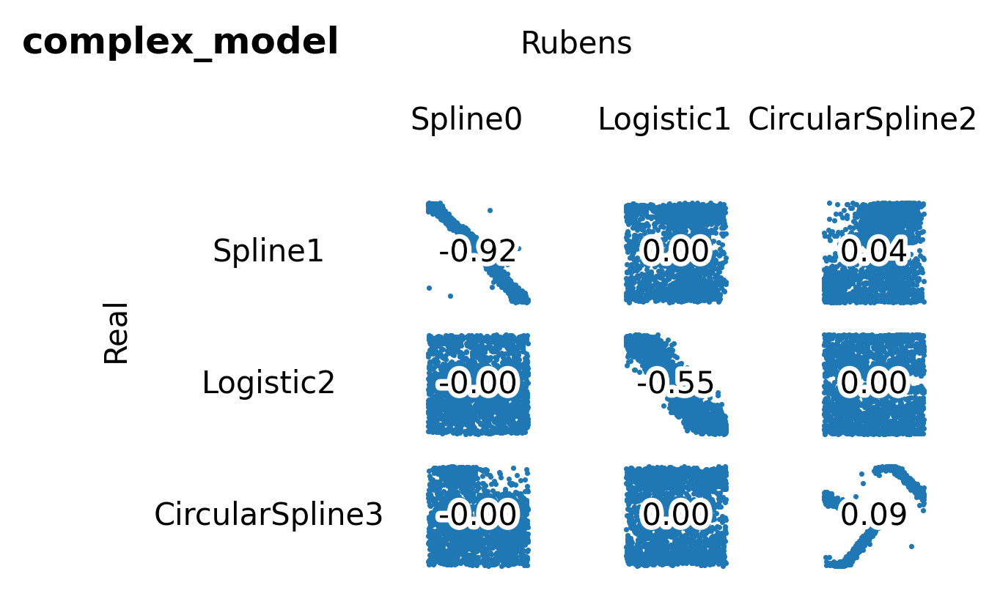

In [71]:
correlation_visualization (adata4, new_adata4, model_text = "complex_model")